In [1]:
import os
import timm
import rich
import torch
import random

import pandas as pd
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn.functional as F

from PIL import Image, UnidentifiedImageError
from tqdm import tqdm
from dotenv import load_dotenv
from torchvision import transforms
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, Dataset, Subset

c:\Users\Hasan\miniconda3\envs\dep_test\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [26]:
# required setting up a .evn file under the same directory as this code
load_dotenv()

current_path = os.getenv("LOCAL_PATH")
data_path = os.path.join(current_path, "data/raw")
print(current_path)

C:\Users\Hasan\OneDrive\Desktop\Projects\ML-Ops


In [27]:
def get_art_styles(root_dir):
    styles = []
    for style in os.listdir(root_dir):
        style_dir = os.path.join(root_dir, style, style)
        if os.path.isdir(style_dir):
            styles.append(style)
    return styles


art_styles = get_art_styles(data_path)
print(art_styles)

['Academic_Art', 'Art_Nouveau', 'Baroque', 'Expressionism', 'Japanese_Art', 'Neoclassicism', 'Primitivism', 'Realism', 'Renaissance', 'Rococo', 'Romanticism', 'Symbolism', 'Western_Medieval']


In [28]:
class ArtDataset(Dataset):
    def __init__(
        self,
        root_dir,
        selected_styles,
        num_images_per_style=None,
        transform=None,
    ):
        """
        Args:
            root_dir (string): Directory with all the images and subdirectories for art styles.
            selected_styles (list): List of art styles that need to be classified.
            num_images_per_style (int, optional): Number of images from each style.
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        self.root_dir = root_dir
        self.transform = transform
        self.images = []
        self.labels = []
        self.style_counts = {}
        self.style_to_idx = {
            style: idx for idx, style in enumerate(selected_styles)
        }

        # Load images and labels
        for style in selected_styles:
            style_dir = os.path.join(root_dir, style)
            if os.path.isdir(style_dir):
                all = os.listdir(style_dir)
                cnt = len(all)
                self.style_counts[style] = cnt
                # Randomly select num_images_per_style images
                if num_images_per_style is None or num_images_per_style > cnt:
                    selected_images = all
                else:
                    selected_images = random.sample(
                        all, min(num_images_per_style, cnt)
                    )
                for img in selected_images:
                    img_path = os.path.join(style_dir, img)
                    self.images.append(img_path)
                    self.labels.append(style)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_name = self.images[idx]
        try:
            image = Image.open(img_name).convert("RGB")
            if self.transform:
                image = self.transform(image)
        except UnidentifiedImageError:
            print(
                f"Warning: Skipping file {img_name} as it couldn't be identified."
            )
            return self.__getitem__(
                (idx + 1) % self.__len__()
            )  # Return the next image

        # Convert label to index
        label_idx = self.style_to_idx[self.labels[idx]]
        return image, label_idx

    def get_random_image_by_style(self, style):
        style_dir = os.path.join(self.root_dir, style, style)
        if os.path.isdir(style_dir):
            images = os.listdir(style_dir)
            if images:
                random_image = random.choice(images)
                return os.path.join(style_dir, random_image)
        return None

In [30]:
# Example usage
if __name__ == "__main__":
    dataset = ArtDataset(root_dir=data_path, selected_styles=art_styles)

    # Example of accessing one item
    image, label = dataset[1]
    print(label)

PermissionError: [Errno 13] Permission denied: 'C:\\Users\\Hasan\\OneDrive\\Desktop\\Projects\\ML-Ops\\data/raw\\Art_Nouveau\\Art_Nouveau'

### Style distribution

In [31]:
def plot_style_distribution(style_counts):
    # Convert to DataFrame for easy plotting
    df = pd.DataFrame(
        list(style_counts.items()), columns=["Art Style", "Count"]
    )
    df = df.sort_values("Count", ascending=False)
    colors = plt.cm.rainbow(df["Count"].rank() / len(df["Count"]))

    # Plotting
    plt.figure(figsize=(12, 8), dpi=200)
    plt.barh(df["Art Style"], df["Count"], color=colors)
    plt.xlabel("Number of Images")
    plt.ylabel("Art Style")
    plt.title("Distribution of Art Styles")
    plt.gca().invert_yaxis()
    plt.show()

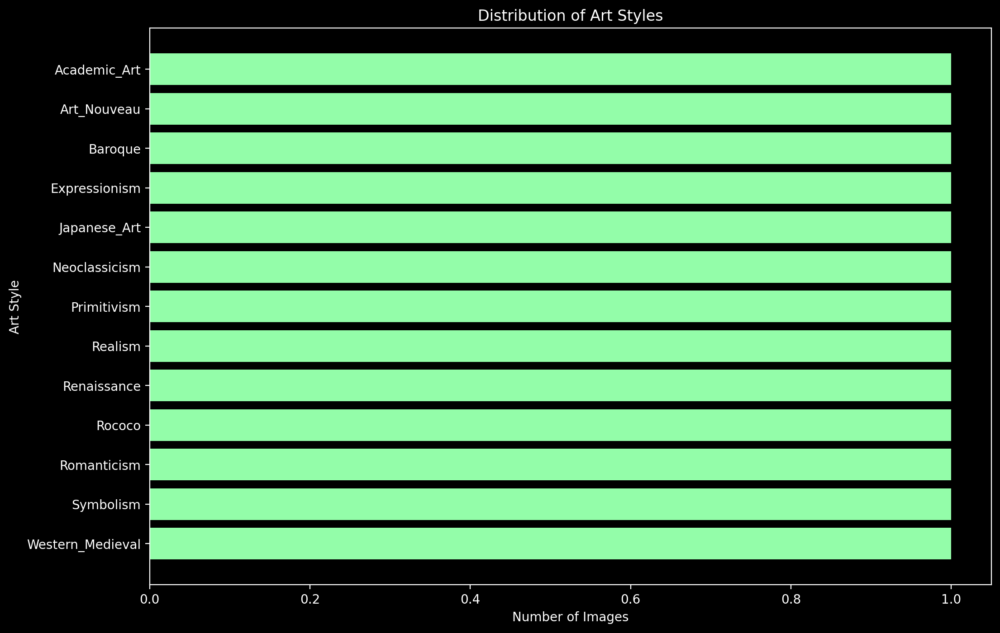

In [32]:
# Example usage
if __name__ == "__main__":
    dataset = ArtDataset(root_dir=data_path, selected_styles=art_styles)

    plot_style_distribution(dataset.style_counts)

In [8]:
def display_random_images(dataset):
    styles = set(dataset.labels)
    fig = plt.figure(figsize=(20, 10), dpi=200)
    fig.subplots_adjust(hspace=0.5)

    for i, style in enumerate(styles):
        ax = plt.subplot(2, 7, i + 1)
        img_path = dataset.get_random_image_by_style(style)
        image = Image.open(img_path)

        ax.imshow(image)
        ax.set_title(style)
        ax.axis("off")

    plt.tight_layout()
    plt.show()

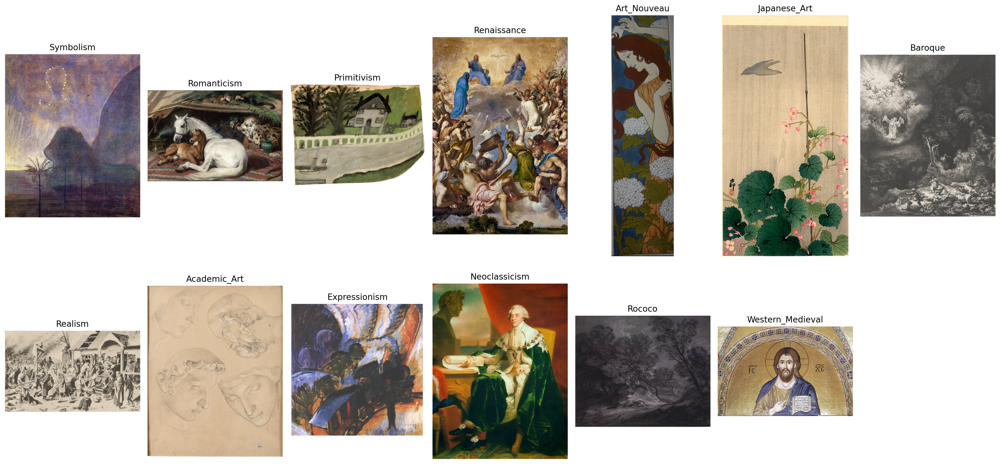

In [9]:
# Example usage
if __name__ == "__main__":
    dataset = ArtDataset(root_dir=current_path, selected_styles=art_styles)

    display_random_images(dataset)

## The self-defined model and the pre-trained model

In [10]:
class ArtCNN(nn.Module):
    def __init__(self, num_classes):
        super(ArtCNN, self).__init__()
        # Convolutional layers
        self.conv1 = nn.Conv2d(
            in_channels=3, out_channels=32, kernel_size=3, padding=1
        )
        self.conv2 = nn.Conv2d(
            in_channels=32, out_channels=64, kernel_size=3, padding=1
        )
        self.conv3 = nn.Conv2d(
            in_channels=64, out_channels=128, kernel_size=3, padding=1
        )

        # Pooling layer
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

        # Adaptive pooling layer
        self.adaptive_pool = nn.AdaptiveAvgPool2d((128, 128))

        # Fully connected layers
        self.fc1 = nn.Linear(128 * 128 * 128, 512)
        self.fc2 = nn.Linear(512, 128)
        self.fc3 = nn.Linear(128, num_classes)

    def forward(self, x):
        # Apply convolutional layers and pooling
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))

        # Apply adaptive pooling
        x = self.adaptive_pool(x)

        # Flatten the tensor
        x = x.view(x.size(0), -1)

        # Apply fully connected layers
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)

        return x

### pretrained model: resnet50

In [11]:
# Checking the models provided by huggingface
avail_pretrained_models = timm.list_models(pretrained=True)
print(avail_pretrained_models)

['bat_resnext26ts.ch_in1k', 'beit_base_patch16_224.in22k_ft_in22k', 'beit_base_patch16_224.in22k_ft_in22k_in1k', 'beit_base_patch16_384.in22k_ft_in22k_in1k', 'beit_large_patch16_224.in22k_ft_in22k', 'beit_large_patch16_224.in22k_ft_in22k_in1k', 'beit_large_patch16_384.in22k_ft_in22k_in1k', 'beit_large_patch16_512.in22k_ft_in22k_in1k', 'beitv2_base_patch16_224.in1k_ft_in1k', 'beitv2_base_patch16_224.in1k_ft_in22k', 'beitv2_base_patch16_224.in1k_ft_in22k_in1k', 'beitv2_large_patch16_224.in1k_ft_in1k', 'beitv2_large_patch16_224.in1k_ft_in22k', 'beitv2_large_patch16_224.in1k_ft_in22k_in1k', 'botnet26t_256.c1_in1k', 'caformer_b36.sail_in1k', 'caformer_b36.sail_in1k_384', 'caformer_b36.sail_in22k', 'caformer_b36.sail_in22k_ft_in1k', 'caformer_b36.sail_in22k_ft_in1k_384', 'caformer_m36.sail_in1k', 'caformer_m36.sail_in1k_384', 'caformer_m36.sail_in22k', 'caformer_m36.sail_in22k_ft_in1k', 'caformer_m36.sail_in22k_ft_in1k_384', 'caformer_s18.sail_in1k', 'caformer_s18.sail_in1k_384', 'caformer_s

In [12]:
pretrained_model = timm.create_model("resnet50", pretrained=True)

In [13]:
# Testing here
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
dummy_input = torch.randn(1, 3, 1024, 1024)
model = ArtCNN(13).to(device)
model(dummy_input)

tensor([[-0.0846, -0.0988,  0.0439,  0.1159, -0.0548, -0.0226,  0.0446, -0.0720,
          0.0034,  0.0207, -0.0957, -0.0221, -0.0096]],
       grad_fn=<AddmmBackward0>)

## Training the model

In [14]:
def train(model, train_loader, criterion, optimizer, device):
    model.train()
    model.to(device)
    running_loss = 0.0
    correct = 0
    total = 0

    train_loader = tqdm(train_loader, desc="Training", unit="batch")

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

        # Update the progress bar
        train_loader.set_postfix(
            loss=(running_loss / total), accuracy=(100 * correct / total)
        )

    epoch_loss = running_loss / len(train_loader)
    epoch_acc = 100 * correct / total

    return epoch_loss, epoch_acc

In [15]:
def evaluate(model, test_loader, criterion, device):
    model.eval()
    model.to(device)
    test_loss = 0.0
    correct = 0
    total = 0

    test_loader = tqdm(test_loader, desc="Evaluating", unit="batch")

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            test_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            # Update the progress bar
            test_loader.set_postfix(
                loss=(test_loss / total), accuracy=(100 * correct / total)
            )

    avg_test_loss = test_loss / len(test_loader)
    test_accuracy = 100 * correct / total

    return avg_test_loss, test_accuracy

In [16]:
# Here we can change the input size of given images
def pad_and_resize(img, target_size=(512, 512)):
    # Resize if any of the dimensions are greater than target size
    if img.size[0] > target_size[0] or img.size[1] > target_size[1]:
        # Scale down yet keeping the aspect ratio
        img.thumbnail(target_size, Image.Resampling.LANCZOS)

    # Calculate padding
    padding_l = (target_size[0] - img.size[0]) // 2
    padding_t = (target_size[1] - img.size[1]) // 2
    padding_r = target_size[0] - img.size[0] - padding_l
    padding_b = target_size[1] - img.size[1] - padding_t
    paddings = (padding_l, padding_t, padding_r, padding_b)

    return transforms.functional.pad(
        img, paddings, padding_mode="constant", fill=0
    )

In [17]:
# Example usage
path = os.path.join(current_path, "Baroque/Baroque", "186707.jpg")
img = Image.open(path).convert("RGB")
transformed_img = pad_and_resize(img)
transformed_img.show()

### Create a only two styles dataset then train the model

In [18]:
# Set the random seed to course number
seed = 2476
random.seed(seed)

# Device configuration
torch.manual_seed(seed)
if torch.cuda.is_available():
    device = torch.device("cuda")
    torch.cuda.manual_seed_all(seed)
else:
    device = torch.device("cpu")
rich.print(f"Device: [red]{device}")

# Transformations
transform = transforms.Compose(
    [
        transforms.Lambda(lambda img: pad_and_resize(img)),
        transforms.ToTensor(),
    ]
)

# Set the parameters for dataloader
selected_styles = ["Symbolism", "Japanese_Art"]
num_images_per_style = 100

# Create the dataset
dataset = ArtDataset(
    root_dir=current_path,
    selected_styles=selected_styles,
    num_images_per_style=num_images_per_style,
    transform=transform,
)

# Split the dataset into training and test sets
train_idx, test_idx = train_test_split(
    list(range(len(dataset))), test_size=0.2, random_state=seed
)

# Create subset for training and test from the indices
train_dataset = Subset(dataset, train_idx)
test_dataset = Subset(dataset, test_idx)

# Create data loaders for training and test sets
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

# Model
num_classes = len(selected_styles)
cnn_model = ArtCNN(num_classes).to(device)

# Loss and optimizers
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(cnn_model.parameters(), lr=1e-4)

Device: cpu

In [19]:
def plot_model_performance(
    model,
    train_loader,
    test_loader,
    criterion,
    optimizer,
    num_epochs,
    device,
    model_name,
):
    # Store the model performances
    training_losses, training_accuracies = [], []
    testing_losses, testing_accuracies = [], []

    for epoch in tqdm(range(num_epochs), desc="Epochs"):
        train_loss, train_acc = train(
            model, train_loader, criterion, optimizer, device
        )
        test_loss, test_acc = evaluate(model, test_loader, criterion, device)

        training_losses.append(train_loss)
        training_accuracies.append(train_acc)
        testing_losses.append(test_loss)
        testing_accuracies.append(test_acc)

    # Save the model
    torch.save(model.state_dict(), f"{model_name}_model.pth")

    # Plot training and testing loss
    plt.figure(figsize=(10, 4), dpi=200)
    plt.plot(range(1, num_epochs + 1), training_losses, label="Training Loss")
    plt.plot(range(1, num_epochs + 1), testing_losses, label="Testing Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"{model_name}: Training and Testing Loss over Epochs")
    plt.legend()
    plt.show()
    plt.savefig(f"{model_name}_loss_plot.png", dpi=200, bbox_inches="tight")

    # Plot training and testing accuracy
    plt.figure(figsize=(10, 4), dpi=200)
    plt.plot(
        range(1, num_epochs + 1),
        training_accuracies,
        label="Training Accuracy",
    )
    plt.plot(
        range(1, num_epochs + 1), testing_accuracies, label="Testing Accuracy"
    )
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy (%)")
    plt.title(f"{model_name}: Training and Testing Accuracy over Epochs")
    plt.legend()
    plt.show()
    plt.savefig(
        f"{model_name}_accuracy_plot.png", dpi=200, bbox_inches="tight"
    )

### the CNN model

Epochs: 100%|██████████| 5/5 [07:38<00:00, 91.64s/it]


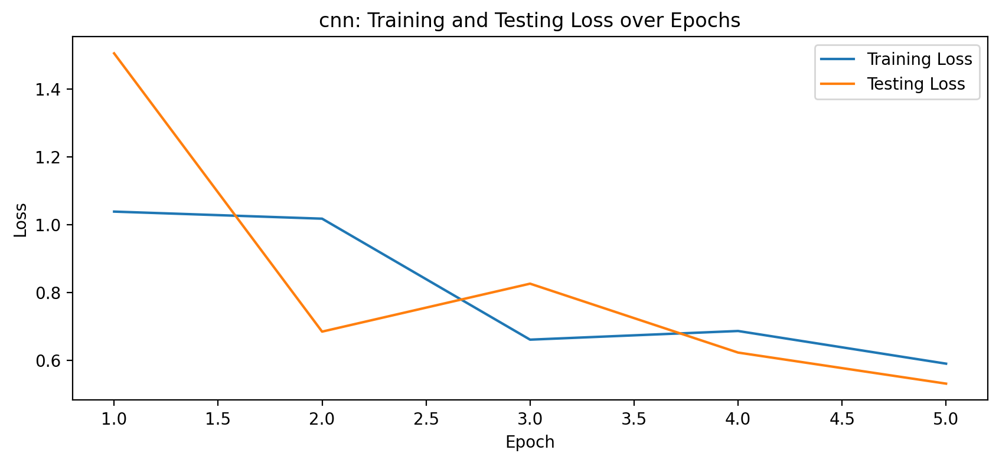

<Figure size 640x480 with 0 Axes>

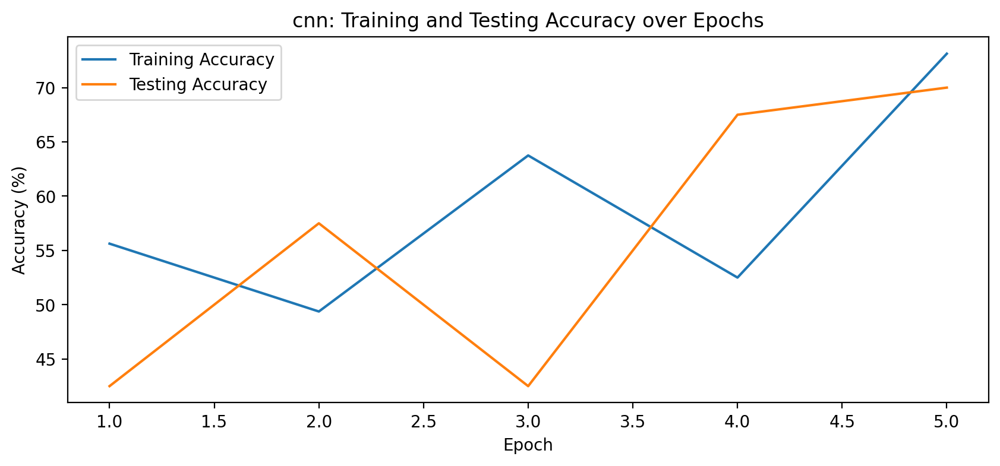

<Figure size 640x480 with 0 Axes>

In [20]:
plot_model_performance(
    cnn_model,
    train_loader,
    test_loader,
    criterion,
    optimizer,
    5,
    device,
    "cnn",
)

### the resnet18 model

Epochs: 100%|██████████| 5/5 [10:03<00:00, 120.71s/it]


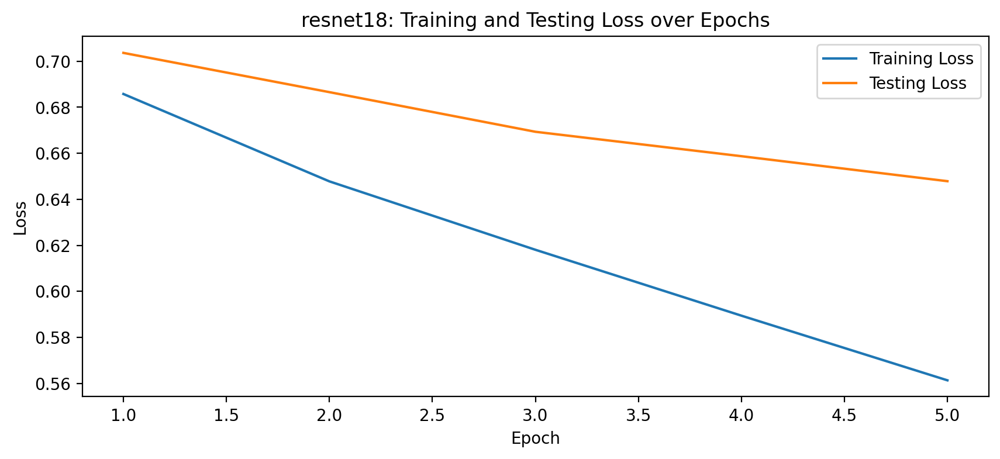

<Figure size 640x480 with 0 Axes>

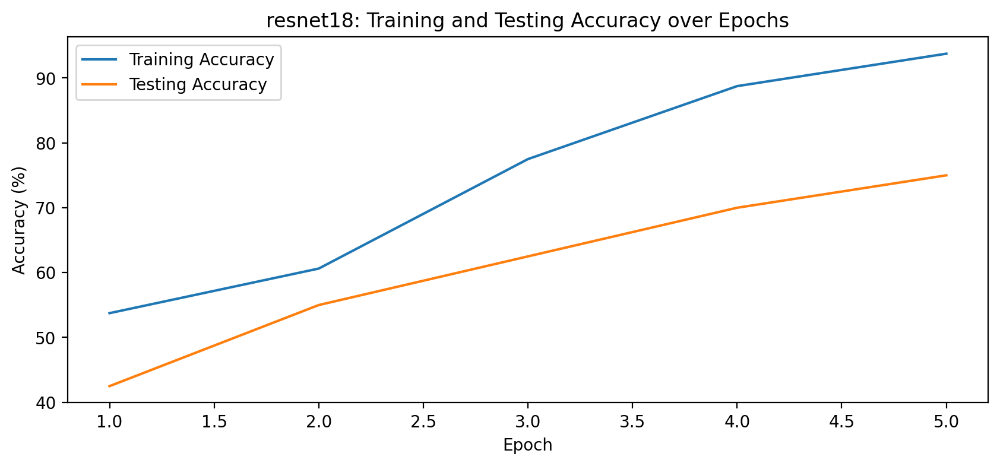

<Figure size 640x480 with 0 Axes>

In [21]:
resnet18_model = timm.create_model(
    "resnet18", pretrained=True, num_classes=num_classes
)
resnet18_optimizer = optim.Adam(resnet18_model.parameters(), lr=1e-4)
plot_model_performance(
    resnet18_model,
    train_loader,
    test_loader,
    criterion,
    resnet18_optimizer,
    5,
    device,
    "resnet18",
)

### the EfficientNet-Lite model

Epochs: 100%|██████████| 5/5 [09:55<00:00, 119.18s/it]


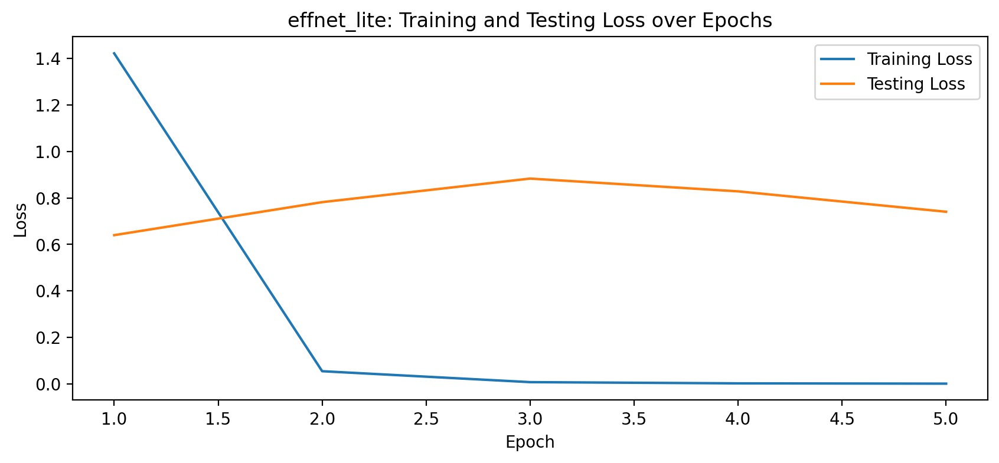

<Figure size 640x480 with 0 Axes>

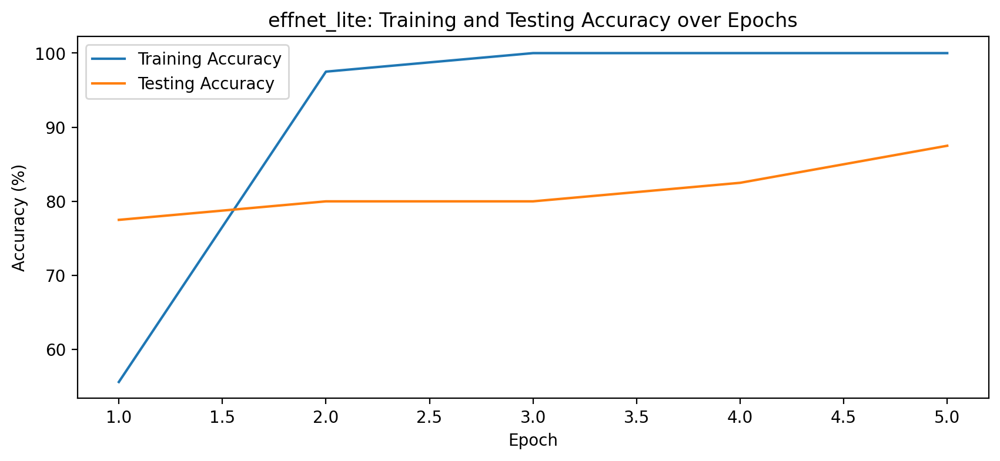

<Figure size 640x480 with 0 Axes>

In [24]:
effnet_model = timm.create_model(
    "tf_efficientnet_lite0", pretrained=True, num_classes=num_classes
)
effnet_optimizer = optim.Adam(effnet_model.parameters(), lr=1e-4)
plot_model_performance(
    effnet_model,
    train_loader,
    test_loader,
    criterion,
    effnet_optimizer,
    5,
    device,
    "effnet_lite",
)

### the resnet34 model

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

Epochs: 100%|██████████| 5/5 [17:30<00:00, 210.15s/it]


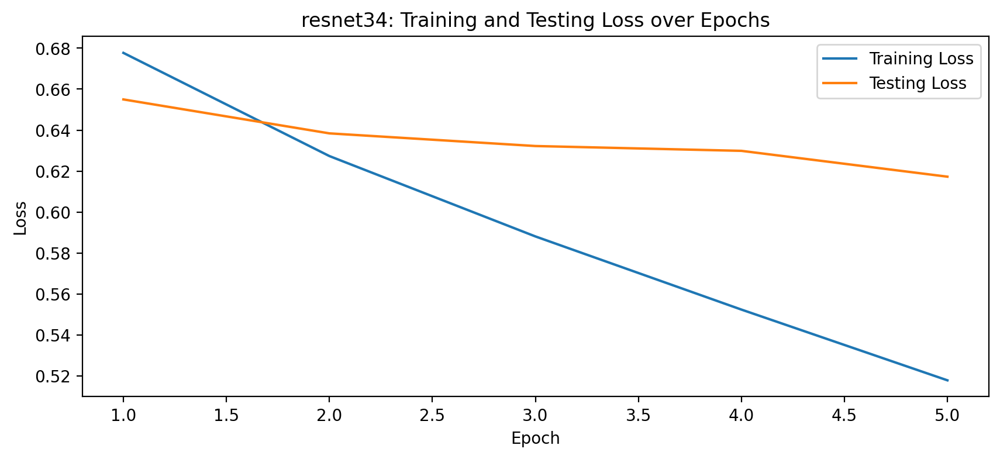

<Figure size 640x480 with 0 Axes>

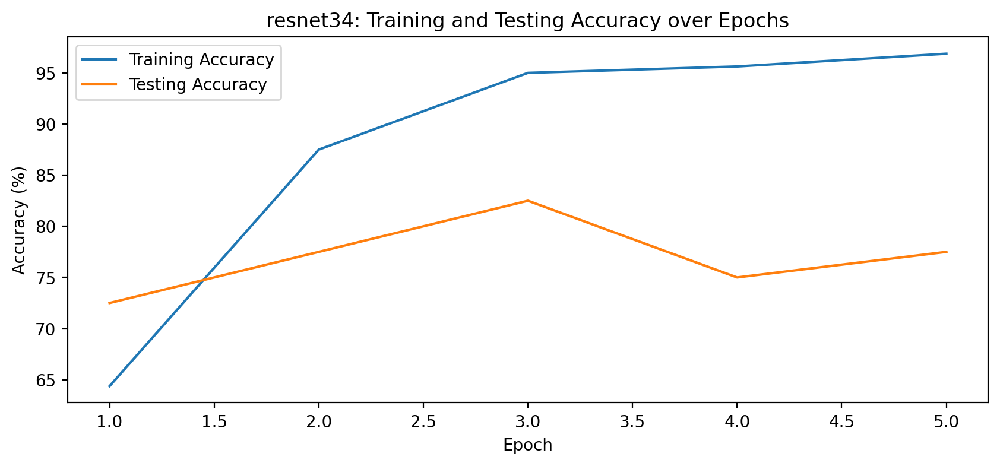

<Figure size 640x480 with 0 Axes>

In [23]:
resnet34_model = timm.create_model(
    "resnet34", pretrained=True, num_classes=num_classes
)
resnet34_optimizer = optim.Adam(resnet34_model.parameters(), lr=1e-4)
plot_model_performance(
    resnet34_model,
    train_loader,
    test_loader,
    criterion,
    resnet34_optimizer,
    5,
    device,
    "resnet34",
)